In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import time
import seaborn as sns
sns.set(style="whitegrid", color_codes=True)
%matplotlib inline
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.grid_search import GridSearchCV
from sklearn.cross_validation import train_test_split, KFold
from sklearn import metrics
import xgboost as xgb
from fancyimpute import BiScaler, KNN, NuclearNormMinimization, SoftImpute, MatrixFactorization, MICE
from sklearn import preprocessing
import operator

Using Theano backend.


In [5]:
train = pd.read_csv('../data/train.csv')
test = pd.read_csv('../data/test.csv')
train = train[train['Park_ID'] != 19]
# train.loc[train['Var1']>=300,'Var1'] = train[train['Var1']>=300]['Var1'].median()
# train.Var1.describe()

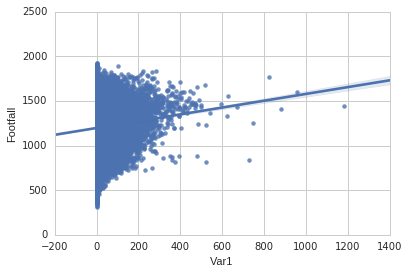

In [21]:
sns.regplot("Var1", "Footfall", train)


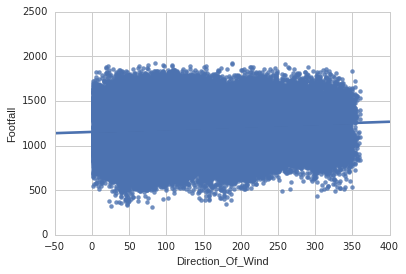

In [34]:
sns.regplot("Direction_Of_Wind", "Footfall", train)


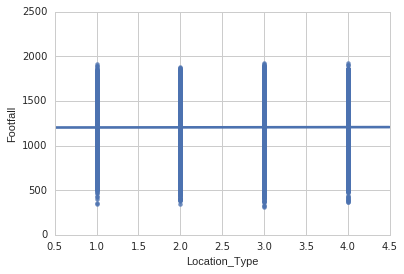

In [35]:
sns.regplot("Location_Type", "Footfall", train)

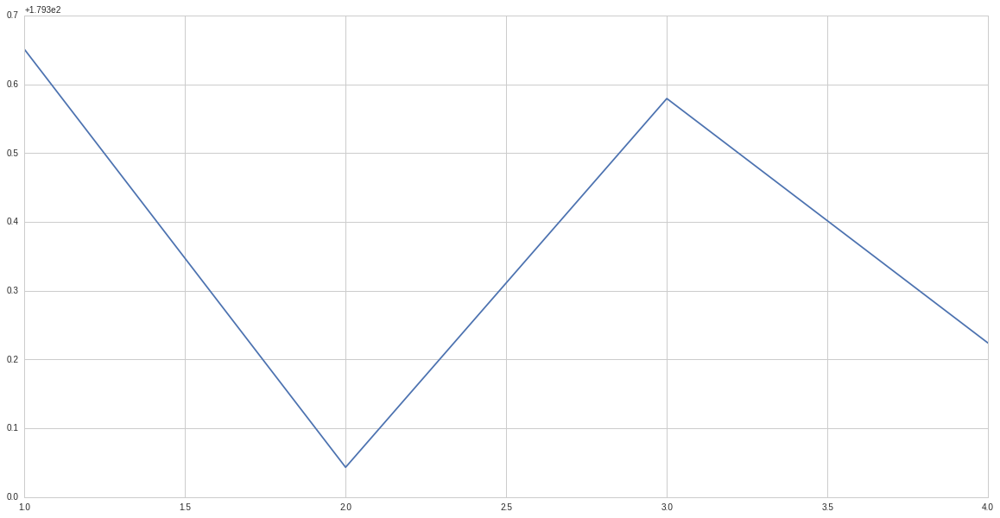

In [9]:
# iska kuch kar sakte hain, location based footfall
plt.figure(figsize=(20, 10))
plt.plot(train.groupby(['Location_Type'])['Direction_Of_Wind'].mean())

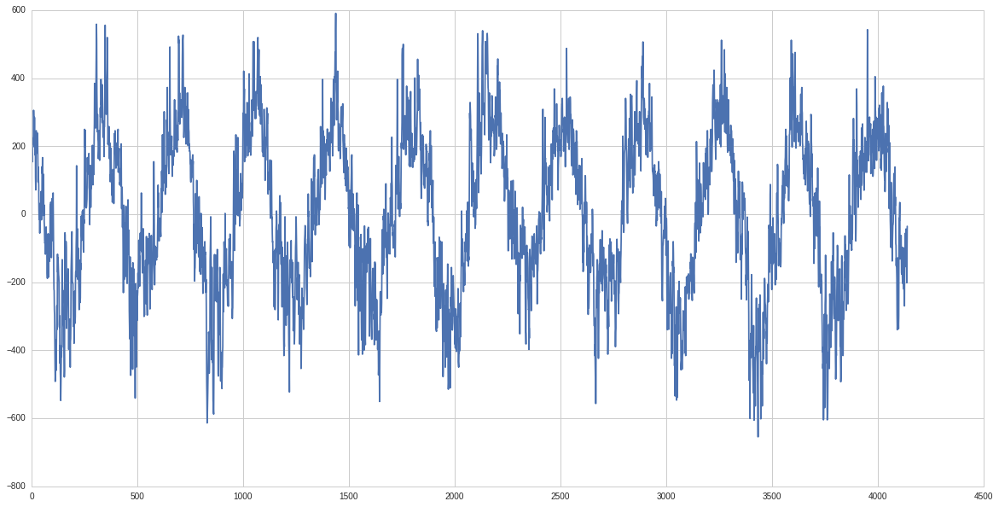

In [22]:
plt.figure(figsize=(20, 10))
plt.plot(train [ train['Park_ID'] == 12]['Footfall'] - train [ train['Park_ID'] == 12]['Footfall'].mean())


In [113]:
train_some_parks.groupby(['Month'])['Footfall'].mean()


Month
1      917.092701
2      937.835834
3     1025.974910
4     1186.283670
5     1313.299935
6     1431.220202
7     1505.489410
8     1489.640274
9     1384.072068
10    1230.678465
11    1083.409877
12     928.919355
Name: Footfall, dtype: float64

/home/arjun/anaconda2/lib/python2.7/site-packages/matplotlib/pyplot.py:516: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


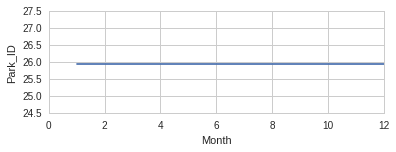

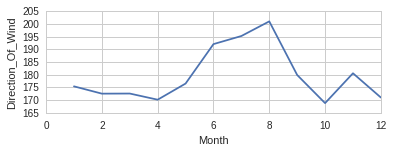

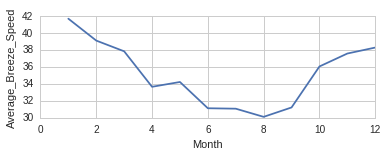

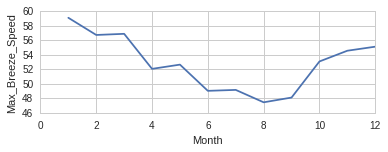

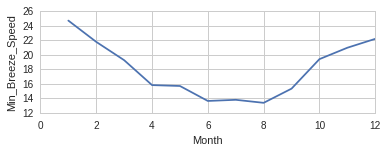

...

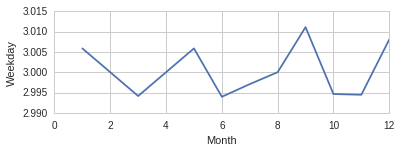

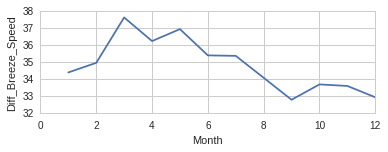

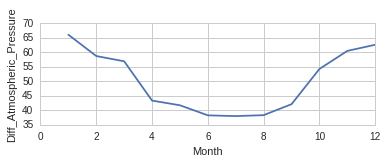

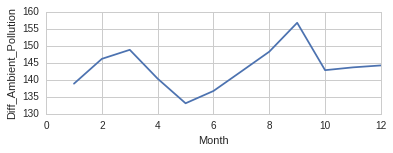

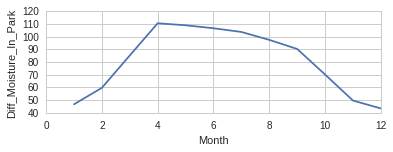

In [12]:
train_some_parks  = train_some_parks.drop([ 'ID', 'Date'], axis =1 )
cols = train_some_parks.columns.values
for col in cols:
        plt.figure()
        plt.subplot(2,1,1)
        plt.plot(train_some_parks.groupby(['Month'])[col].mean())
        plt.xlabel('Month')
        plt.ylabel(col)

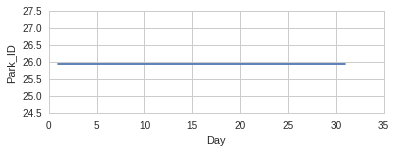

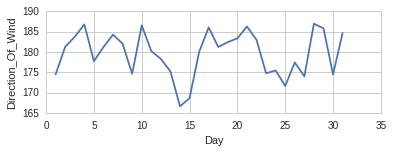

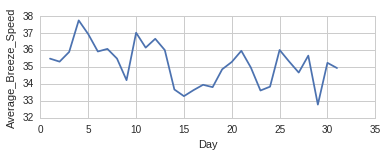

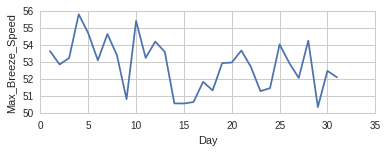

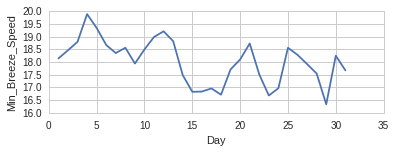

...

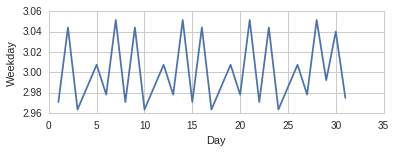

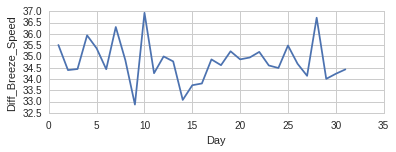

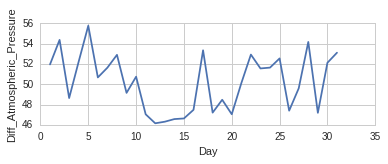

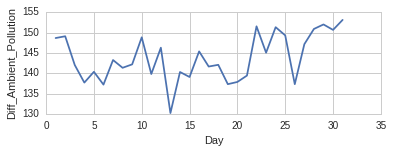

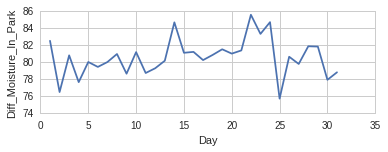

In [13]:
# train_some_parks  = train_some_parks.drop([ 'ID', Date'], axis =1 )
cols = train_some_parks.columns.values
for col in cols:
        plt.figure()
        plt.subplot(2,1,1)
        plt.plot(train_some_parks.groupby(['Day'])[col].mean())
        plt.xlabel('Day')
        plt.ylabel(col)

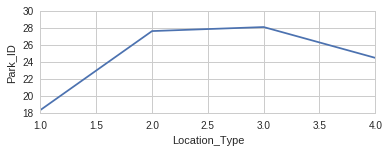

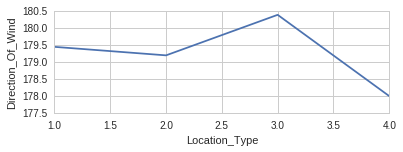

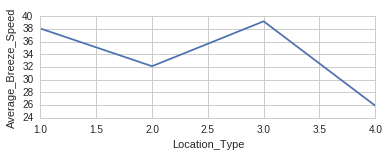

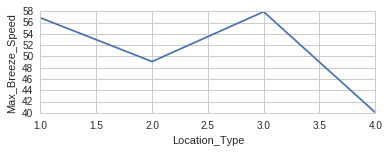

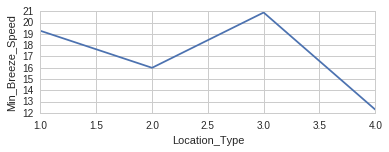

...

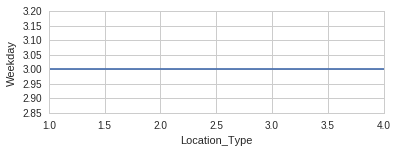

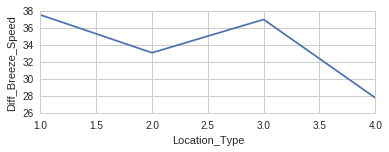

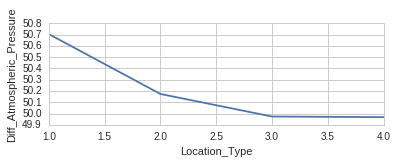

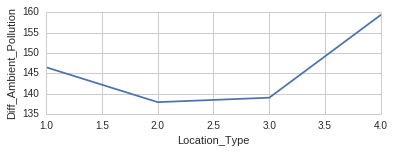

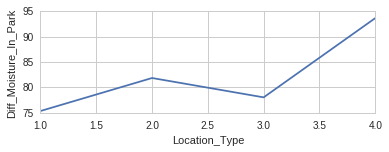

In [14]:
# train_some_parks  = train_some_parks.drop([ 'ID', Date'], axis =1 )
cols = train_some_parks.columns.values
for col in cols:
        plt.figure()
        plt.subplot(2,1,1)
        plt.plot(train_some_parks.groupby(['Location_Type'])[col].mean())
        plt.xlabel('Location_Type')
        plt.ylabel(col)

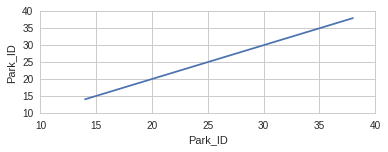

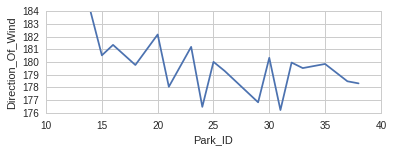

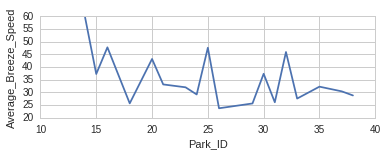

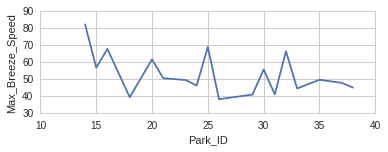

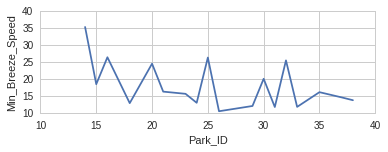

...

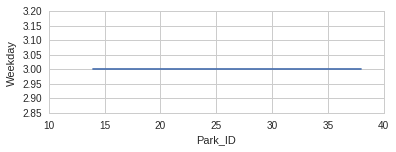

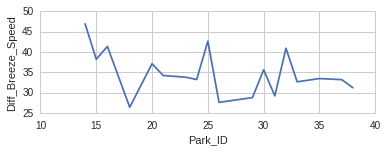

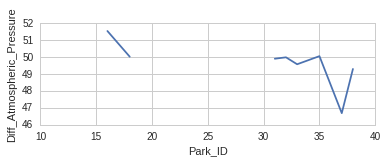

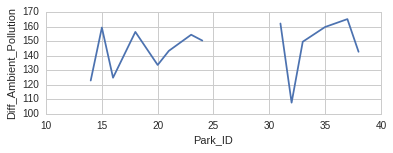

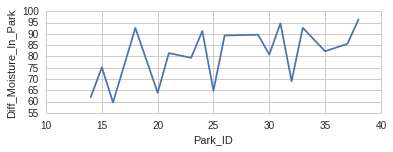

In [15]:
# train_some_parks  = train_some_parks.drop([ 'ID', 'Date'], axis =1 )
cols = train_some_parks.columns.values
for col in cols:
        plt.figure()
        plt.subplot(2,1,1)
        plt.plot(train_some_parks.groupby(['Park_ID'])[col].mean())
        plt.xlabel('Park_ID')
        plt.ylabel(col)

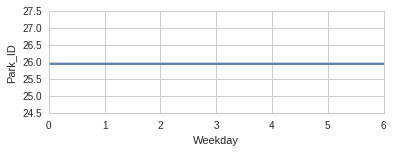

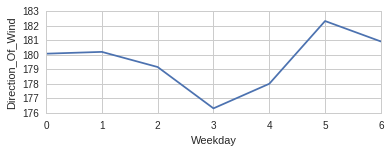

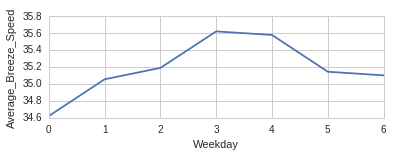

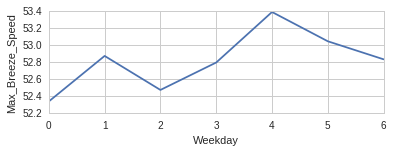

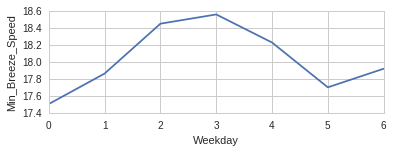

...

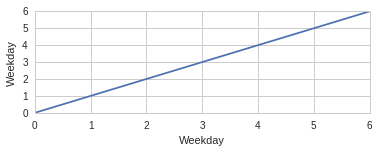

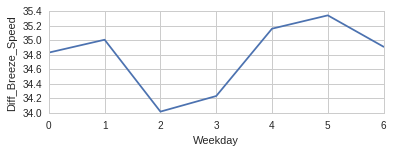

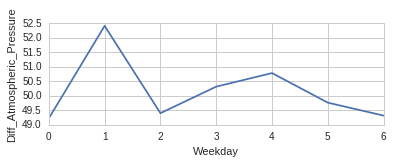

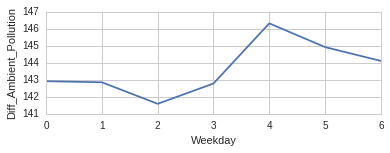

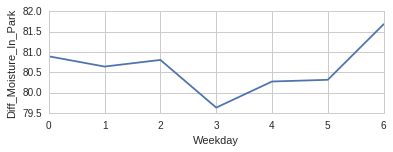

In [16]:
# train_some_parks  = train_some_parks.drop([ 'ID', Date'], axis =1 )
cols = train_some_parks.columns.values
for col in cols:
        plt.figure()
        plt.subplot(2,1,1)
        plt.plot(train_some_parks.groupby(['Weekday'])[col].mean())
        plt.xlabel('Weekday')
        plt.ylabel(col)

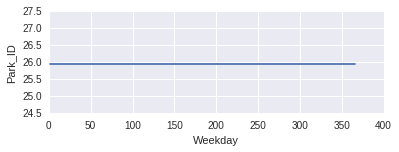

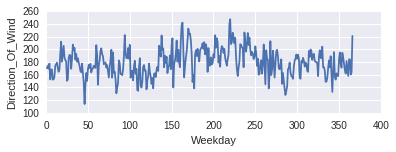

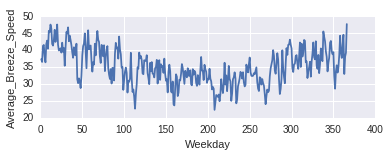

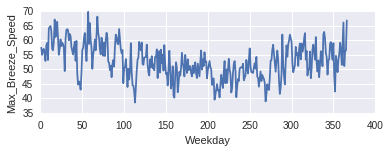

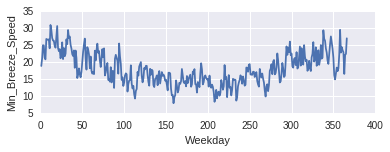

...

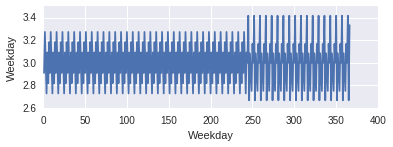

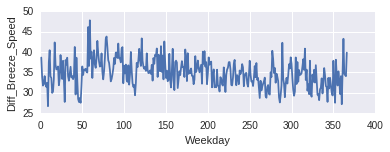

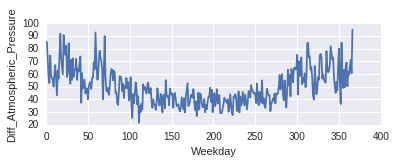

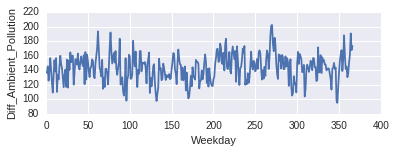

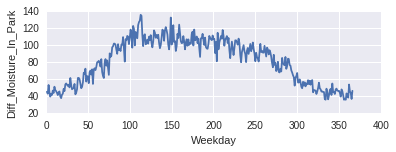

In [114]:
# train_some_parks  = train_some_parks.drop([ 'ID', Date'], axis =1 )
cols = train_some_parks.columns.values
for col in cols:
        plt.figure()
        plt.subplot(2,1,1)
        plt.plot(train_some_parks.groupby(['DayOfYear'])[col].mean())
        plt.xlabel('DayOf')
        plt.ylabel(col)

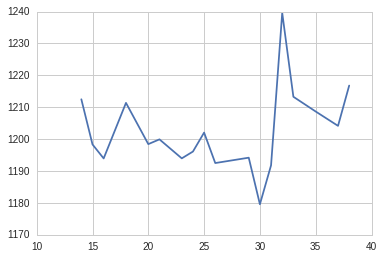

In [17]:
plt.plot(train_some_parks.groupby(['Park_ID'])['Footfall'].mean())

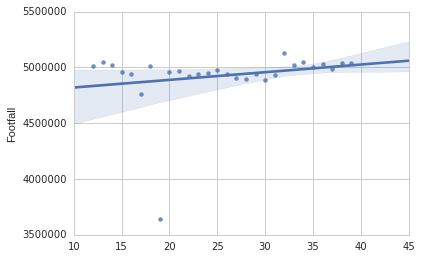

In [44]:
sns.regplot(train.Park_ID.unique(), train.groupby(['Park_ID'])['Footfall'].sum())

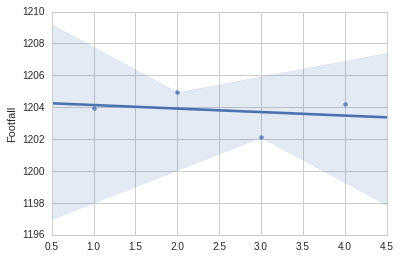

In [18]:
sns.regplot(train["Location_Type"].unique(), train.groupby(['Location_Type'])['Footfall'].mean())

In [7]:
park_random  = np.random.choice(train.Park_ID.unique(), 27)
#[1,2,3]==[1,2]
train_some_parks = train[train['Park_ID'].isin(park_random)]

train_some_parks.Date = pd.to_datetime(train_some_parks.Date, dayfirst=True)
train_some_parks['Day'] = train_some_parks['Date'].dt.day
train_some_parks['Month'] = train_some_parks['Date'].dt.month
train_some_parks['Year'] = train_some_parks['Date'].dt.year
train_some_parks['DayOfYear'] = train_some_parks['Date'].dt.dayofyear
train_some_parks['Weekday'] = train_some_parks['Date'].dt.weekday

train_some_parks_1991 = train_some_parks[train_some_parks['Year'] == 1991]
train_some_parks_1993 = train_some_parks[train_some_parks['Year'] == 1993]
train_some_parks_1995 = train_some_parks[train_some_parks['Year'] == 1995]
train_some_parks_1997 = train_some_parks[train_some_parks['Year'] == 1997]
train_some_parks_2000 = train_some_parks[train_some_parks['Year'] == 2000]

train_some_parks['Diff_Breeze_Speed'] = train_some_parks['Max_Breeze_Speed'] - train_some_parks['Min_Breeze_Speed']
train_some_parks['Diff_Atmospheric_Pressure'] = train_some_parks['Max_Atmospheric_Pressure'] - train_some_parks['Min_Atmospheric_Pressure']
train_some_parks['Diff_Ambient_Pollution'] = train_some_parks['Max_Ambient_Pollution'] - train_some_parks['Min_Ambient_Pollution']
train_some_parks['Diff_Moisture_In_Park'] = train_some_parks['Max_Moisture_In_Park'] - train_some_parks['Min_Moisture_In_Park']
    

/home/arjun/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/home/arjun/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/home/arjun/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/in

In [8]:
park_random  = np.random.choice(test.Park_ID.unique(), 27)
#[1,2,3]==[1,2]
test_some_parks = test[test['Park_ID'].isin(park_random)]

test_some_parks.Date = pd.to_datetime(test_some_parks.Date, dayfirst=True)
test_some_parks['Day'] = test_some_parks['Date'].dt.day
test_some_parks['Month'] = test_some_parks['Date'].dt.month
test_some_parks['Year'] = test_some_parks['Date'].dt.year
test_some_parks['DayOfYear'] = test_some_parks['Date'].dt.dayofyear
test_some_parks['Weekday'] = test_some_parks['Date'].dt.weekday

/home/arjun/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/home/arjun/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/home/arjun/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/in

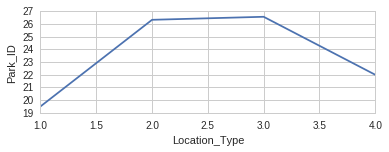

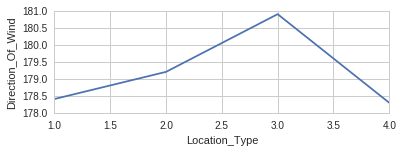

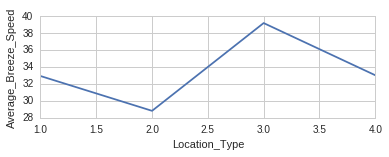

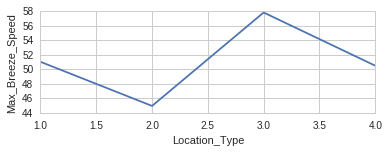

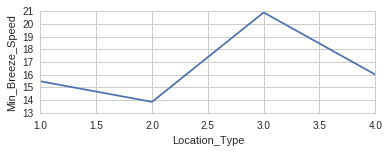

...

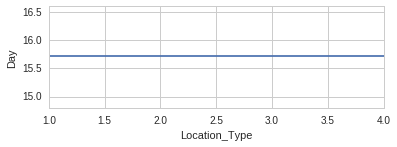

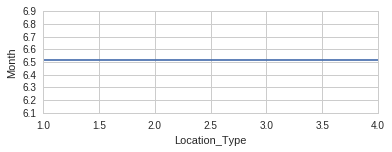

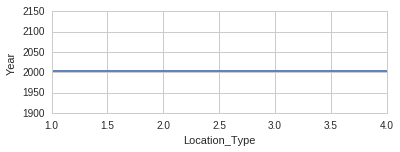

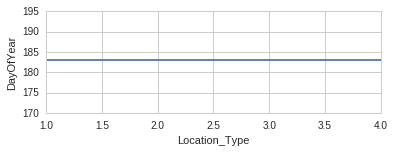

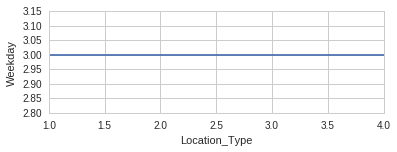

In [19]:
test_some_parks  = test_some_parks.drop([ 'ID', 'Date'], axis =1 )
cols = test_some_parks.columns.values
for col in cols:
        plt.figure()
        plt.subplot(2,1,1)
        plt.plot(test_some_parks.groupby(['Location_Type'])[col].mean())
        plt.xlabel('Location_Type')
        plt.ylabel(col)

In [20]:
train_some_parks.dtypes

Park_ID                           int64
Direction_Of_Wind               float64
Average_Breeze_Speed            float64
Max_Breeze_Speed                float64
Min_Breeze_Speed                float64
Var1                            float64
Average_Atmospheric_Pressure    float64
Max_Atmospheric_Pressure        float64
Min_Atmospheric_Pressure        float64
Min_Ambient_Pollution           float64
Max_Ambient_Pollution           float64
Average_Moisture_In_Park        float64
Max_Moisture_In_Park            float64
Min_Moisture_In_Park            float64
Location_Type                     int64
Footfall                          int64
Day                               int64
Month                             int64
Year                              int64
DayOfYear                         int64
Weekday                           int64
Diff_Breeze_Speed               float64
Diff_Atmospheric_Pressure       float64
Diff_Ambient_Pollution          float64
Diff_Moisture_In_Park           float64


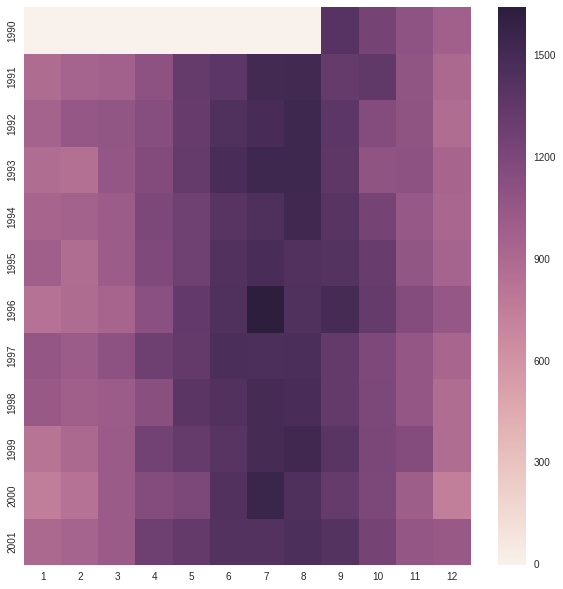

In [69]:
A= train_some_parks.groupby(['Year', 'Month'])['Footfall'].mean() 
dummy = np.zeros((8,1))
A = np.array(A)
A = np.append(dummy,A)
Index = np.sort(train_some_parks.Year.unique())
Cols = np.sort(train_some_parks.Month.unique())

# year_month_matrix = np.zeros([12,12])
year_month_matrix = np.reshape(np.array(A), [12,12] )

year_month_footfall = pd.DataFrame(year_month_matrix, index=Index, columns=Cols)
# plt.pcolor(year_month_footfall)
# plt.yticks(np.arange(0.5, len(year_month_footfall.index), 1), year_month_footfall.index)
# plt.xticks(np.arange(0.5, len(year_month_footfall.columns), 1), year_month_footfall.columns)
# plt.show()


plt.figure(figsize=(10, 10))
sns.heatmap(year_month_footfall)


In [112]:
A= train_some_parks.groupby(['Month', 'Day'])['Var1'].mean() 
B= train_some_parks.groupby(['Month', 'Day'])['Var1'].count()
C = A.divide(B)
Index = train_some_parks.Month.unique()
Cols = np.sort(train_some_parks.Day.unique())

month_day_var1 = np.zeros([12,31])
for i in Index:
    for j in Cols:
        try:
            month_day_var1[i-1, j-1] = A[i,j]
        except:
            month_day_var1[i-1, j-1] = 0
            

month_day_var1_df = pd.DataFrame(month_day_var1, index=Index, columns=Cols)
# plt.pcolor(year_month_footfall)
# plt.yticks(np.arange(0.5, len(year_month_footfall.index), 1), year_month_footfall.index)
# plt.xticks(np.arange(0.5, len(year_month_footfall.columns), 1), year_month_footfall.columns)
# plt.show()


plt.figure(figsize=(10, 10))
sns.heatmap(month_day_var1_df)



ValueError: must supply a tuple to get_group with multiple grouping keys

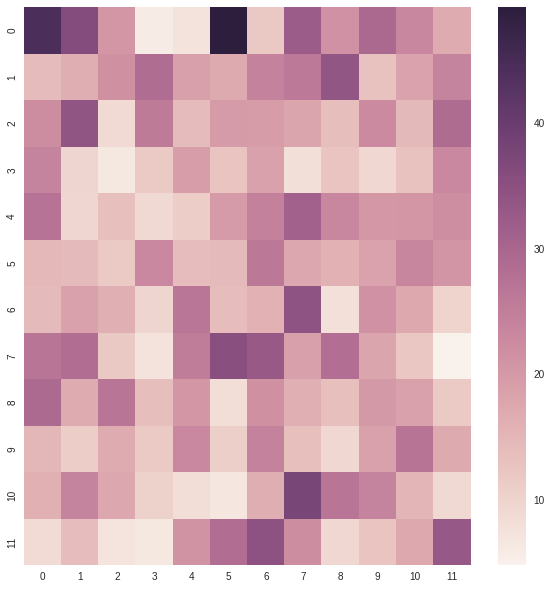

In [257]:
A= train_some_parks.groupby(['Year', 'Month'])['Var1'].mean() 
B= train_some_parks.groupby(['Year', 'Month'])['Var1'].count()
C = A.divide(B)
year_month_matrix = np.reshape(np.array(A), [12,12] )
Index = train_some_parks.Year.unique()
Cols = train_some_parks.Month.unique()            

year_month_var1_df = pd.DataFrame(A, index=Index, columns=Cols)
# plt.pcolor(year_month_footfall)
# plt.yticks(np.arange(0.5, len(year_month_footfall.index), 1), year_month_footfall.index)
# plt.xticks(np.arange(0.5, len(year_month_footfall.columns), 1), year_month_footfall.columns)
# plt.show()


plt.figure(figsize=(10, 10))
sns.heatmap(year_month_matrix)

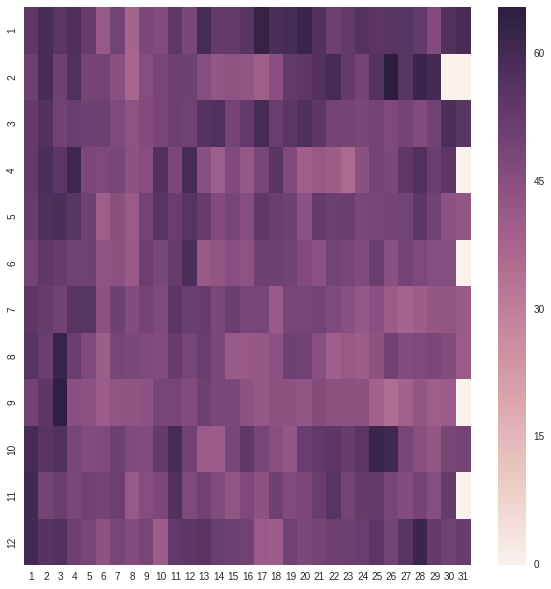

In [247]:
A= train_some_parks.groupby(['Month', 'Day'])['Max_Breeze_Speed'].mean() 
B= train_some_parks.groupby(['Month', 'Day'])['Max_Breeze_Speed'].count()
C = A.divide(B)
Index = train_some_parks.Month.unique()
Cols = np.sort(train_some_parks.Day.unique())

month_day_breeze = np.zeros([12,31])
for i in Index:
    for j in Cols:
        try:
            month_day_breeze[i-1, j-1] = A[i,j]
        except:
            month_day_breeze[i-1, j-1] = 0
            

month_day_breeze_df = pd.DataFrame(month_day_breeze, index=Index, columns=Cols)
# plt.pcolor(year_month_footfall)
# plt.yticks(np.arange(0.5, len(year_month_footfall.index), 1), year_month_footfall.index)
# plt.xticks(np.arange(0.5, len(year_month_footfall.columns), 1), year_month_footfall.columns)
# plt.show()


plt.figure(figsize=(10, 10))
sns.heatmap(month_day_breeze_df)



In [261]:
train_some_parks.describe()
train_some_parks_dropped = train_some_parks.dropna(axis=1, how='any')
train_some_parks_dropped

,ID,Park_ID,Var1,Average_Moisture_In_Park,Max_Moisture_In_Park,Min_Moisture_In_Park,Location_Type,Footfall,Day,Month,Year,DayOfYear,Weekday
count,6.624000e+04,66240.000000,66240.000000,66240.000000,66240.000000,66240.000000,66240.000000,66240.000000,66240.000000,66240.000000,66240.000000,66240.000000,66240.000000
mean,3.518677e+06,27.375000,18.548917,246.959466,284.036458,199.657518,2.875000,1204.091048,15.777536,6.593720,1995.823188,185.344928,3.000242
std,1.195124e+05,7.920563,37.092077,29.777463,16.090195,47.425132,0.927032,251.950029,8.755328,3.461778,3.276517,105.955755,2.000438
min,3.311712e+06,12.000000,0.000000,102.000000,141.000000,48.000000,1.000000,310.000000,1.000000,1.000000,1990.000000,1.000000,0.000000
25%,3.415194e+06,23.500000,0.000000,228.000000,279.000000,168.000000,2.000000,1023.000000,8.000000,4.000000,1993.000000,93.750000,1.000000
50%,3.518676e+06,28.500000,0.830000,252.000000,288.000000,204.000000,3.000000,1216.000000,16.000000,7.000000,1996.000000,186.500000,3.000000
75%,3.622157e+06,32.750000,20.750000,270.000000,294.000000,234.000000,4.000000,1402.000000,23.000000,10.000000,1999.000000,278.000000,5.000000
max,3.725639e+06,39.000000,361.880000,300.000000,300.000000,300.000000,4.000000,1925.000000,31.000000,12.000000,2001.000000,366.000000,6.000000


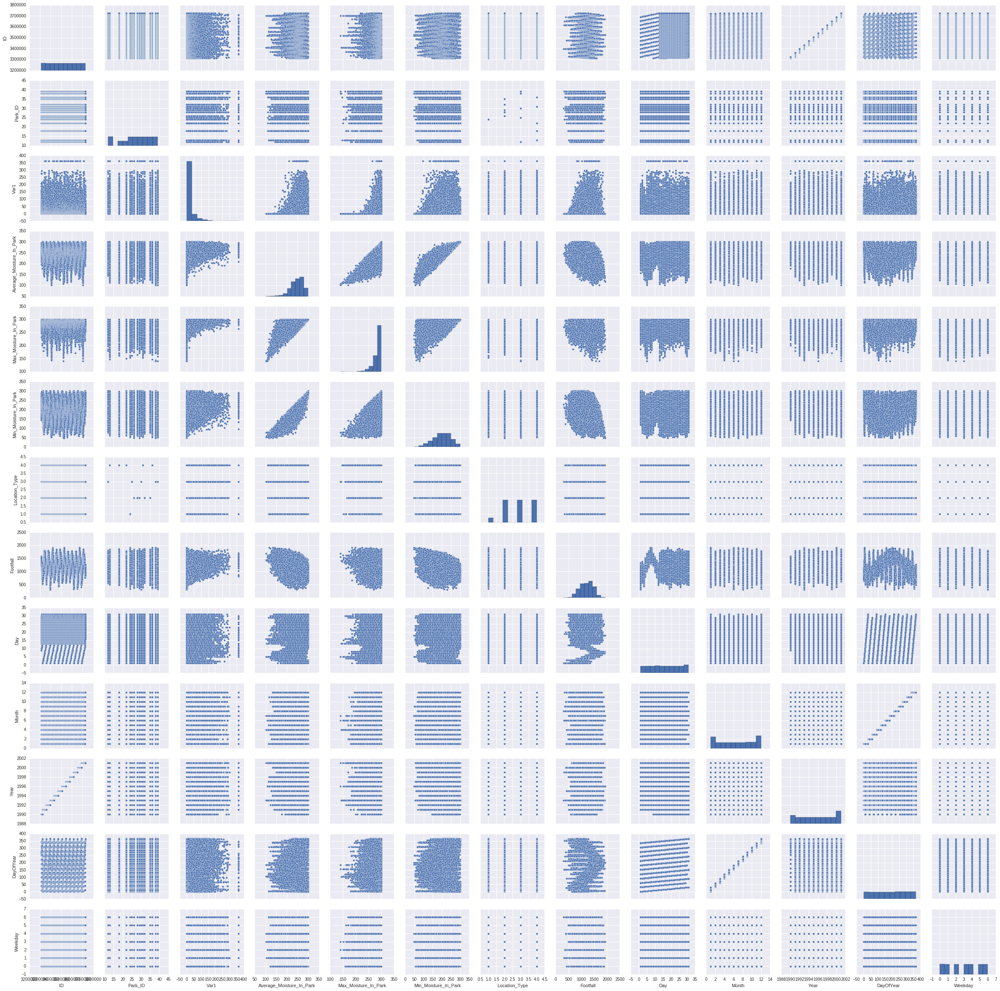

In [262]:
sns.pairplot(train_some_parks_dropped)

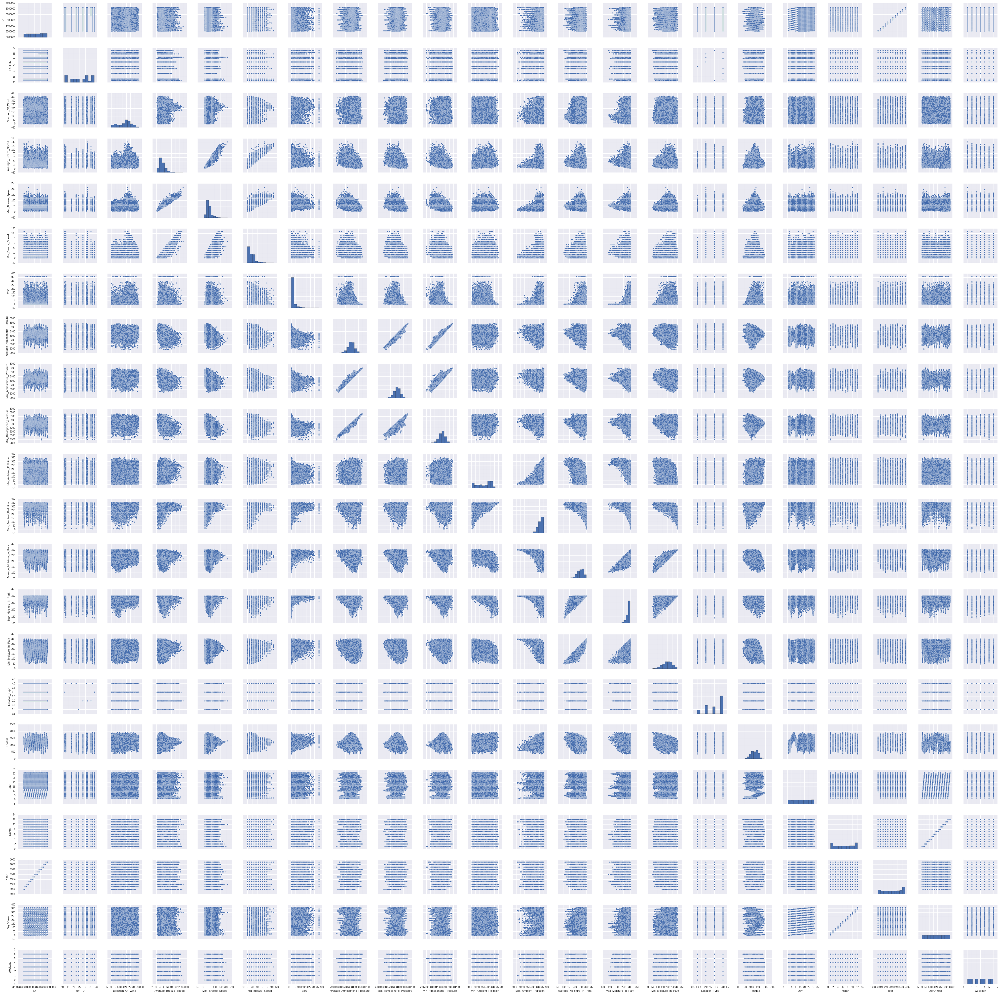

In [263]:
train_some_parks.describe()
train_some_parks_dropped1 = train_some_parks.dropna(axis=0, how='any')
sns_plot= sns.pairplot(train_some_parks_dropped1)
sns_plot.savefig("output.png")


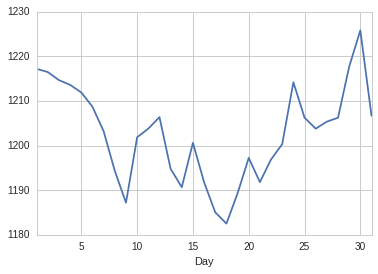

In [80]:
grp = train_some_parks.groupby(['Day'])['Footfall'].mean()
plt.figure(); grp.plot();

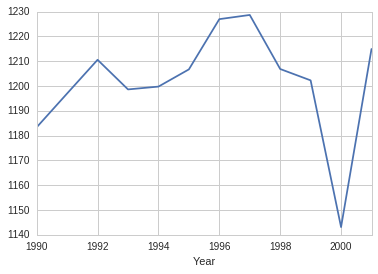

In [79]:
train_some_parks.groupby('Year')['Footfall'].mean().plot()

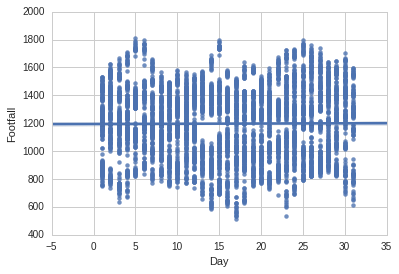

In [81]:
sns.regplot(train_some_parks_1991['Day'], train_some_parks_1991['Footfall'])

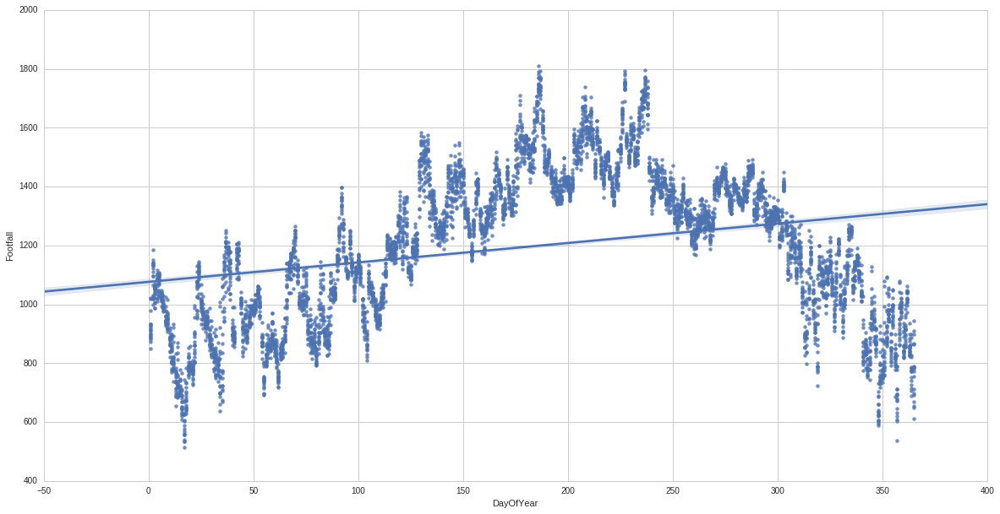

In [82]:
plt.figure(figsize=(20, 10))
#train_some_parks_1991 = train_some_parks_1991[train_some_parks_1991['DayOfYear']<200]
sns.regplot(train_some_parks_1991['DayOfYear'], train_some_parks_1991['Footfall'])

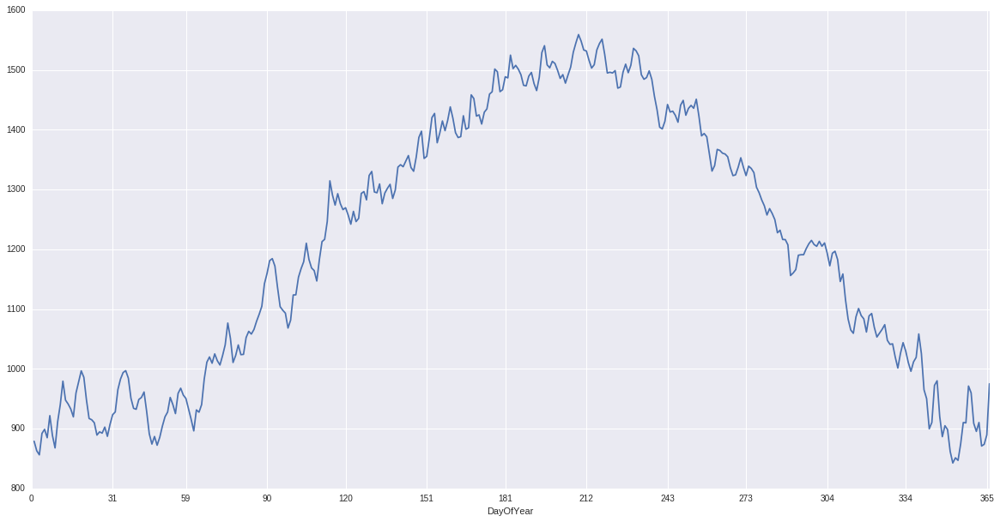

In [84]:
plt.figure(figsize=(20, 10))
sns.set_style("darkgrid", {"axes.xtick.major.size": "7"})
x = [31,28,31,30,31,30,31,31,30,31,30,31]
xticks = []
dayTot = 0
for i in x:
    xticks.append(dayTot)
    dayTot += i
xticks.append(dayTot)
train_some_parks.groupby(['DayOfYear'])['Footfall'].mean().plot(xticks=xticks)


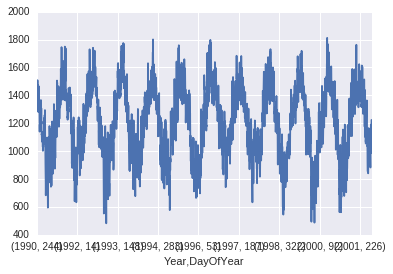

In [85]:
train_some_parks.groupby(['Year','DayOfYear'])['Footfall'].mean().plot()


[[<matplotlib.text.Text at 0x7fa2b882c250>,

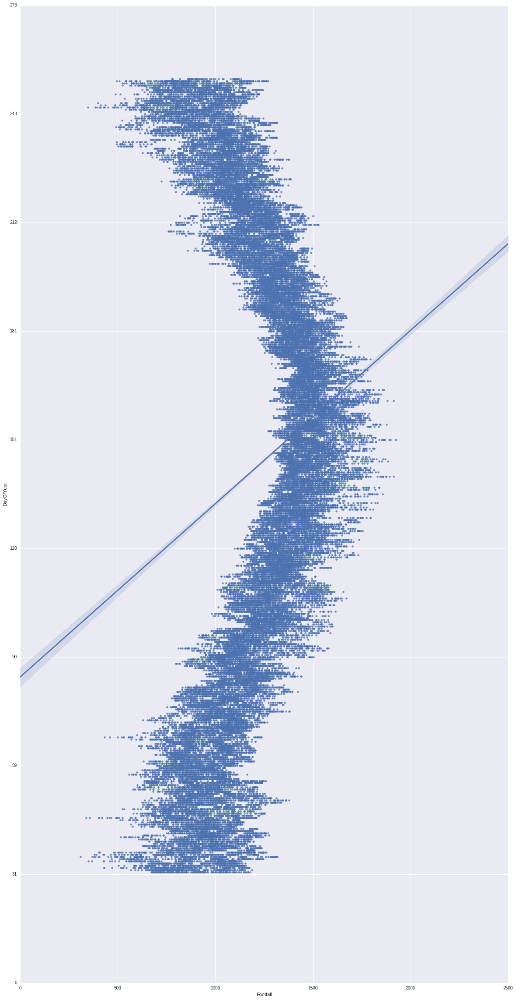

In [87]:
days = train_some_parks.DayOfYear
footfall = train_some_parks.Footfall
plt.figure(figsize=(20, 40))

plotS = sns.regplot(footfall, days)
xticks
plotS.set(yticklabels=xticks)


In [124]:
train_some_parks[train_some_parks['Footfall'] <= 600][['DayOfYear', 'Year', 'Park_ID']] 
train_some_parks.groupby(['Weekday'])['Footfa']

,DayOfYear,Year,Park_ID
9110,256,1992,14
11714,26,2000,14
40157,17,1991,22
40849,256,1992,22
40850,286,1992,22
40852,347,1992,22
40877,152,1993,22
40879,213,1993,22
40880,244,1993,22
41664,93,1995,22


In [132]:
train_some_parks[(train_some_parks['DayOfYear'] == 26) & (train_some_parks['Year'] == 2001)]['Footfall']

12080    778
43819    721
93499    808
Name: Footfall, dtype: int64

In [156]:
train_some_parks[(train_some_parks['Year'] == 1990) & (train_some_parks['Month']==8)].shape

(8, 23)

In [142]:
train_some_parks[(train_some_parks['Month'].isin([8, 12]))].groupby(['Year','Park_ID','Month'])['Footfall'].sum()

Year  Park_ID  Month
1990  18       8         5069
               12       21572
      26       8         4993
               12       20997
1991  17       8        39484
               12       28343
      18       8        43942
               12       30898
      26       8        43513
               12       30196
1992  17       8        43925
               12       32398
      18       8        43856
               12       32925
      26       8        43839
               12       31502
1993  17       8        41780
               12       33488
      18       8        41364
               12       32771
      26       8        40689
               12       32268
1994  17       8        42912
               12       32920
      18       8        42385
               12       31607
      26       8        41847
               12       31010
1995  17       8        42286
               12       33628
                        ...  
1997  17       8        42727
               12  

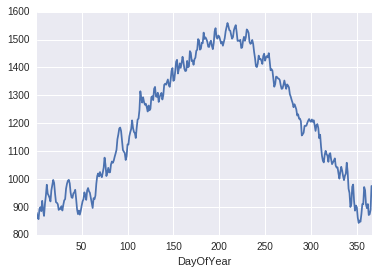

In [88]:
train_some_parks.groupby(['DayOfYear'])['Footfall'].mean().plot()


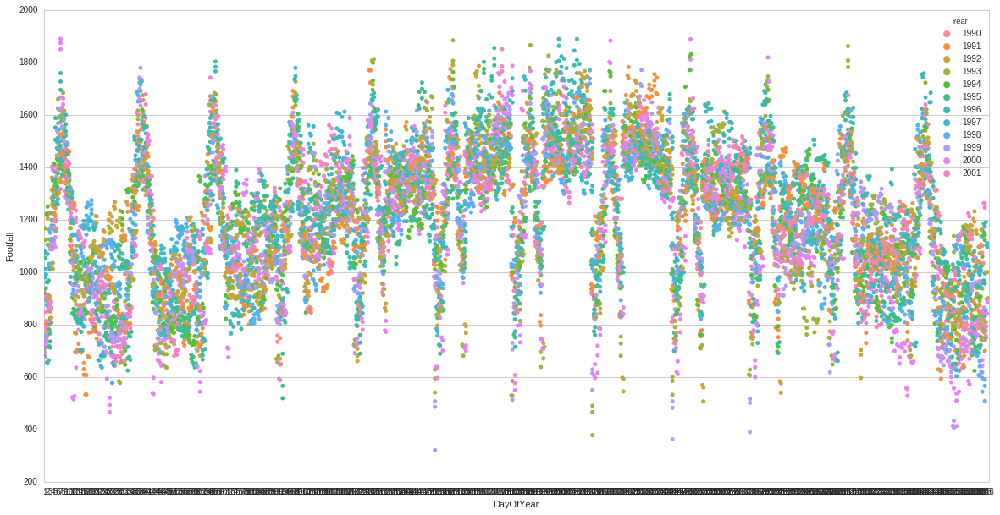

In [63]:
plt.figure(figsize=(20, 10))
sns.swarmplot(x='DayOfYear', y='Footfall', hue = 'Year', data= train_some_parks) 

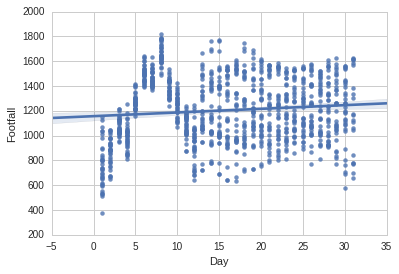

In [44]:
sns.regplot(train_some_parks_1993['Day'], train_some_parks_1993['Footfall'])

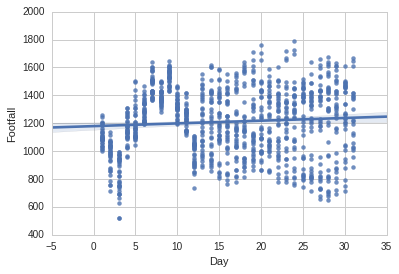

In [45]:
sns.regplot(train_some_parks_1995['Day'], train_some_parks_1995['Footfall'])

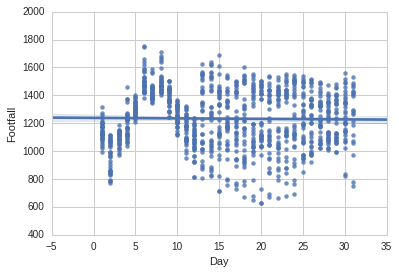

In [46]:
sns.regplot(train_some_parks_1997['Day'], train_some_parks_1997['Footfall'])

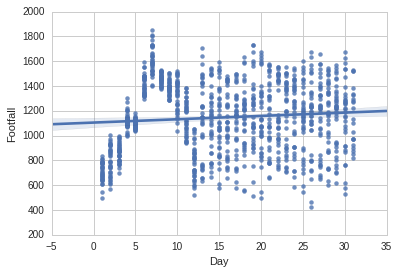

In [47]:
sns.regplot(train_some_parks_2000['Day'], train_some_parks_2000['Footfall'])

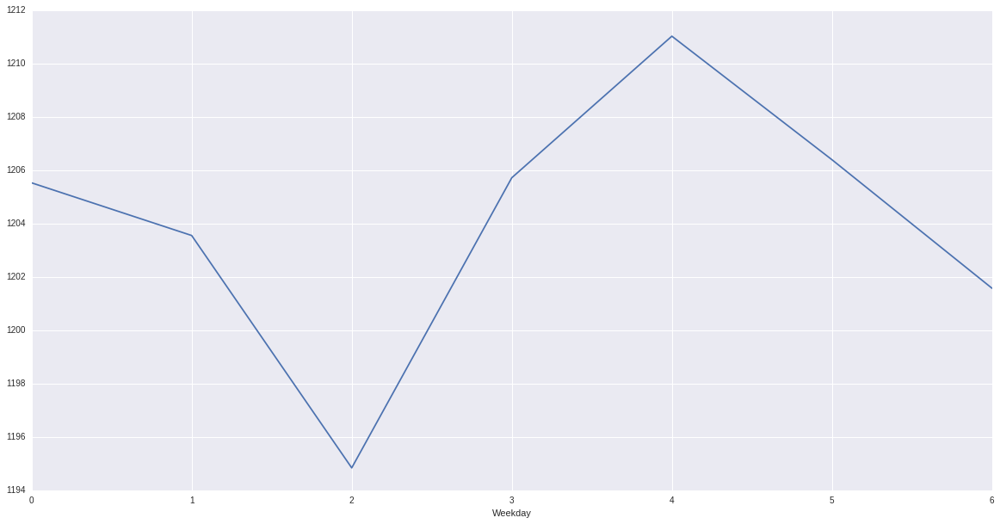

In [268]:
plt.figure(figsize=(20, 10))
# Mon -0 
A = train_some_parks.groupby(['Weekday'])['Footfall'].mean().plot()

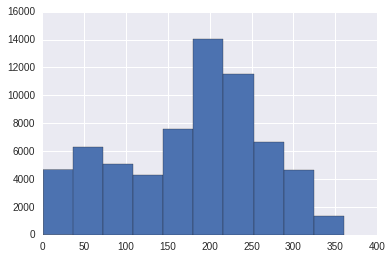

In [302]:

train_some_parks.Direction_Of_Wind.hist()

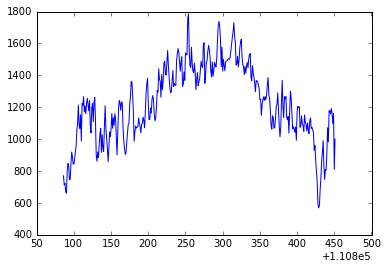

In [70]:
train.Date = pd.to_datetime(train.Date)
plt.plot(train[(train.Park_ID == 39)& (train.Date.dt.year==1992)]['Footfall'])

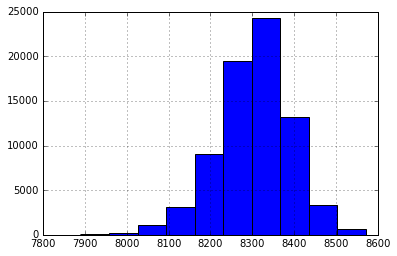

In [21]:
train.Min_Atmospheric_Pressure.hist()
